In [1]:
import gc
import h5py
import torch
import numpy as np
import torch.nn as nn

from matplotlib import pyplot as plt
from numpy.random import default_rng
from scipy.signal import filtfilt, butter
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

from das_util import try_gpu
from das_util import next_power_of_2
from das_util import fk_filter_2cones
from das_denoise_models import unet, dataflow
from das_denoise_training import train_augmentation

In [2]:
dir_terra = '/fd1/QibinShi_data/akdas/M35Aug10/terra/'
dir_kkfls = '/fd1/QibinShi_data/akdas/M35Aug10/kkfls/'
sample_rate = 25
delta_space = 10

full_terra = []
full_kkfls = []
for i in np.arange(24, 26):
    file = 'decimator2_2023-08-10_14.' + str(i) + '.04_UTC.h5'
    with h5py.File(dir_terra + file, 'r') as f:
        quake1 = f['Acquisition']['Raw[0]']['RawData'][:1500, :7500].T
    full_terra.append(quake1)
    file = 'decimator2_2023-08-10_14.' + str(i) + '.03_UTC.h5'
    with h5py.File(dir_kkfls + file, 'r') as f:
        quake2 = f['Acquisition']['Raw[0]']['RawData'][:1500, :7500].T
    full_kkfls.append(quake2)
    
terra_data = np.concatenate(full_terra, axis=1)
kkfls_data = np.concatenate(full_kkfls, axis=1)

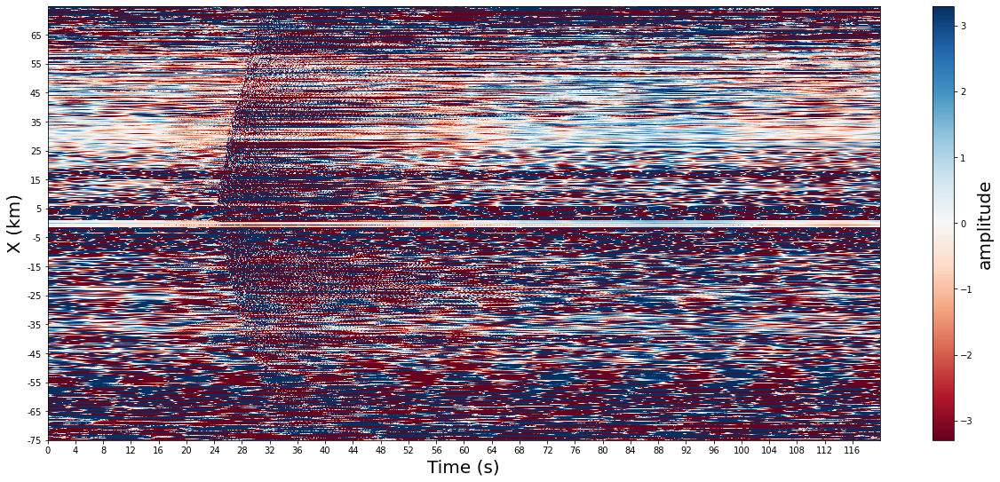

In [3]:
all_data = np.append(kkfls_data[::-1,:], terra_data, axis=0)

plt.figure(figsize=(21, 9)); cmap=plt.cm.get_cmap('RdBu'); max_amp = np.median(np.fabs(all_data))
x, y=np.arange(all_data.shape[1]), np.arange(all_data.shape[0])
plt.pcolormesh(x, y, all_data, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.xticks(np.arange(0, 3000, 100), np.arange(0, 3000/sample_rate, 100/sample_rate).astype(int))
plt.yticks(np.arange(0, 15000, 1000), (np.arange(-7500, 7500, 1000)/1000*delta_space).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("X (km)", fontsize=20)
cbr=plt.colorbar(); cbr.set_label('amplitude', fontsize = 20)

In [14]:
filt_terra, mask_fk_terra, fk_terra = fk_filter_2cones(terra_data.T, w1=0.005, w2=0.25, cone1=True, cone2=True)
filt_kkfls, mask_fk_kkfls, fk_kkfls = fk_filter_2cones(kkfls_data.T, w1=0.005, w2=0.25, cone1=True, cone2=True)
all_filt = np.append(filt_kkfls.T[::-1,:], filt_terra.T, axis=0)

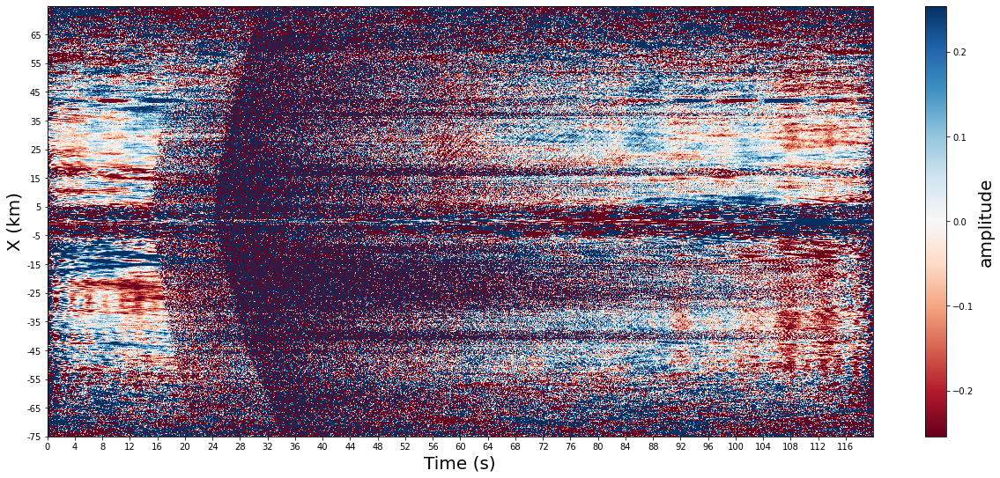

In [15]:
plt.figure(figsize=(21, 9)); max_amp = np.median(np.fabs(all_filt.real))
plt.pcolormesh(x, y, all_filt.real, shading='auto', vmin=-max_amp, vmax=max_amp, cmap=cmap)
plt.xticks(np.arange(0, 3000, 100), np.arange(0, 3000/sample_rate, 100/sample_rate).astype(int))
plt.yticks(np.arange(0, 15000, 1000), (np.arange(-7500, 7500, 1000)/1000*delta_space).astype(int))
plt.xlabel("Time (s)", fontsize=20); plt.ylabel("X (km)", fontsize=20)
cbr=plt.colorbar(); cbr.set_label('amplitude', fontsize = 20)

In [6]:
with h5py.File('/fd1/QibinShi_data/akdas/qibin_data/' + 'M3.5_Aug10.hdf5', 'w') as f:
    f.create_dataset("raw", data=all_data)
    f.create_dataset("fk_filtered", data=all_filt.real)

/tmp/ipykernel_400143/2022824642.py:11: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(mask_fk_terra)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
/tmp/ipykernel_400143/2022824642.py:22: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(mask_fk_kkfls)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)


Text(0, 0.5, 'Frequency(Hz)')

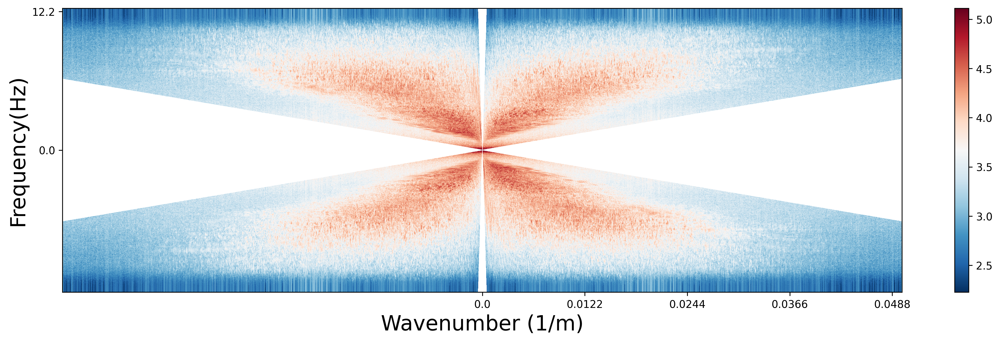

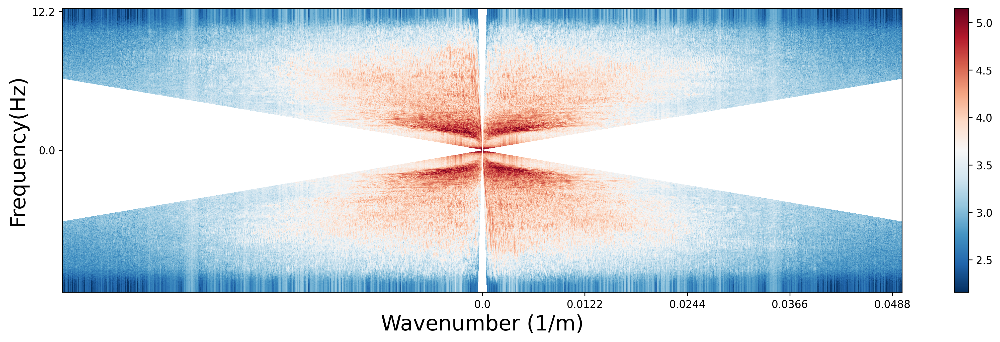

In [16]:
f0 = np.fft.fftshift(np.fft.fftfreq(next_power_of_2(3000),d=1./sample_rate))
k0 = np.fft.fftshift(np.fft.fftfreq(next_power_of_2(7500),d=delta_space))
df = f0[1]-f0[0]
dk = k0[1]-k0[0]

amps = np.log10(np.abs(fk_terra)).flatten()
q1=np.percentile(amps, q=1)
q2=np.percentile(amps, q=99)

plt.figure(figsize=(18, 5), dpi=300)
plt.imshow(np.log10(np.abs(mask_fk_terra)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
plt.colorbar()
plt.xticks(np.arange(int(len(k0)/2), len(k0), 1000), np.round(k0[np.arange(int(len(k0)/2), len(k0), 1000)], decimals=4))
plt.yticks(np.arange(int(len(f0)/2), len(f0), 2000), np.round(f0[np.arange(int(len(f0)/2), len(f0), 2000)], decimals=1))
plt.xlabel("Wavenumber (1/m)", fontsize=20)
plt.ylabel("Frequency(Hz)", fontsize=20)

amps = np.log10(np.abs(fk_kkfls)).flatten()
q1=np.percentile(amps, q=1)
q2=np.percentile(amps, q=99)
plt.figure(figsize=(18, 5), dpi=300)
plt.imshow(np.log10(np.abs(mask_fk_kkfls)), aspect='auto', cmap=cmap.reversed(), origin='lower',vmax=q2, vmin=q1)
plt.colorbar()
plt.xticks(np.arange(int(len(k0)/2), len(k0), 1000), np.round(k0[np.arange(int(len(k0)/2), len(k0), 1000)], decimals=4))
plt.yticks(np.arange(int(len(f0)/2), len(f0), 2000), np.round(f0[np.arange(int(len(f0)/2), len(f0), 2000)], decimals=1))
plt.xlabel("Wavenumber (1/m)", fontsize=20)
plt.ylabel("Frequency(Hz)", fontsize=20)